In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime
import folium

from tqdm import tqdm_notebook
from glob import glob
from tqdm.auto import tqdm
import pickle

import CaGeo.algorithms.SegmentFeatures as sf

In [2]:
with open("Data/Not_Resampled/FIXED_sum_not_resample_10km__rot_euc/model.pkl", "rb") as fd:
    geolet = pickle.load(fd)

In [3]:
len(geolet.candidate_geolets)

6159

In [4]:
import CaGeo.algorithms.BasicFeatures as bf
import CaGeo.algorithms.AggregateFeatures as af
import CaGeo.algorithms.SegmentFeatures as sf
from shapely.geometry import LineString
from shapely.ops import unary_union, polygonize

def count_self_intersections(latitudes, longitudes):
    line = LineString(zip(longitudes, latitudes))
    multi_line = unary_union(line)
    intersections = list(polygonize(multi_line))
    return len(intersections)

additional_features = {
    "avg_speed": lambda x: np.mean(bf.speed(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    "std_accel": lambda x: np.mean(bf.acceleration(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    #"std_accel2": lambda x: np.mean(bf.acceleration2(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    "distance_sum": lambda x: np.sum(bf.distance(lat=x.latitude, lon=x.longitude, accurate=False)),
    "distance_std": lambda x: np.std(bf.distance(lat=x.latitude, lon=x.longitude, accurate=False)),
    "start2end_distance": lambda x: np.sum(bf.distance(lat=np.array([x.latitude[1], x.latitude[-1]]), 
                                                       lon=np.array([x.longitude[1], x.longitude[-1]])*3600, accurate=False)),

    "straightness": lambda x: sf.straightness(lat=x.latitude, lon=x.longitude),
    "meanSquaredDisplacement": lambda x: sf.meanSquaredDisplacement(lat=x.latitude, lon=x.longitude),
    "sinuosity": lambda x: sf.sinuosity(lat=x.latitude, lon=x.longitude),
    "intensityUse": lambda x: sf.intensityUse(lat=x.latitude, lon=x.longitude),

    "intersections": lambda x: count_self_intersections(x.latitude, x.longitude),
}

new_data = dict()
for feature_name, feature_function in tqdm(additional_features.items(), position=0):
    res_list = []
    
    for shapelet in tqdm(geolet.candidate_geolets.values(), position=1, leave=False):
        res_list.append(feature_function(shapelet))

    new_data[feature_name] = res_list

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

In [5]:
df_features = pd.DataFrame.from_dict(new_data)

df_features.describe()

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections
count,6159.000000,6.159000e+03,6159.000000,6159.000000,6159.000000,6159.000000,6.159000e+03,6159.000000,6159.000000,6159.000000
mean,10.900524,1.223086e+00,7.824716,0.574452,5017.934184,0.850140,7.669285e-04,1.363377,226.905658,343.990745
std,5.379766,1.119611e+00,2.896077,0.765671,3000.447314,0.260310,5.650673e-04,2.941067,342.876509,6756.564599
min,0.000045,3.482001e-10,0.002410,0.000318,0.000000,0.000793,5.874176e-11,0.011147,127.855309,0.000000
25%,5.640760,3.576723e-01,6.231306,0.032886,2336.636183,0.831151,3.063174e-04,0.640419,136.153014,0.000000
50%,12.118063,1.001787e+00,9.510156,0.277643,5366.788790,0.992391,6.883362e-04,0.820998,167.947503,0.000000
75%,15.611918,1.704742e+00,9.950986,0.790660,7698.898457,0.998938,1.140149e-03,1.195271,242.972855,0.000000
max,23.908791,1.632304e+01,9.997699,4.696528,9692.498993,1.000000,4.227449e-03,79.611819,21994.290103,312323.000000


In [6]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_features_scaled = pd.DataFrame(scaler.fit_transform(df_features), columns=df_features.columns)

In [7]:
df_features_scaled.describe()

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections
count,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000,6159.000000
mean,0.455920,0.074930,0.782599,0.122255,0.517713,0.850021,0.181416,0.016988,0.004530,0.001101
std,0.225012,0.068591,0.289744,0.163040,0.309564,0.260516,0.133666,0.036948,0.015680,0.021633
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.235927,0.021912,0.623183,0.006935,0.241077,0.831017,0.072459,0.007905,0.000379,0.000000
50%,0.506845,0.061373,0.951223,0.059053,0.553705,0.992385,0.162825,0.010174,0.001834,0.000000
75%,0.652977,0.104438,0.995327,0.168294,0.794315,0.998937,0.269701,0.014876,0.005265,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_features_scaled = pd.DataFrame(scaler.fit_transform(df_features), columns=df_features.columns)
df_features_scaled.describe()

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections
count,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03
mean,1.476692e-16,1.292106e-16,-5.076129e-17,-5.537596e-17,1.199812e-16,1.292106e-16,2.953384e-16,-1.153666e-17,4.153197e-17,-6.921995e-18
std,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00
min,-2.026364e+00,-1.092509e+00,-2.701220e+00,-7.499053e-01,-1.672531e+00,-3.263098e+00,-1.357344e+00,-4.598125e-01,-2.889040e-01,-5.091621e-02
25%,-9.777732e-01,-7.730221e-01,-5.502405e-01,-7.073662e-01,-8.937053e-01,-7.295172e-02,-8.152100e-01,-2.458347e-01,-2.647018e-01,-5.091621e-02
50%,2.263367e-01,-1.976733e-01,5.820208e-01,-3.876767e-01,1.162770e-01,5.465152e-01,-1.390960e-01,-1.844305e-01,-1.719655e-01,-5.091621e-02
75%,8.758331e-01,4.302338e-01,7.342495e-01,2.824001e-01,8.935941e-01,5.716659e-01,6.605418e-01,-5.716273e-02,4.686381e-02,-5.091621e-02
max,2.418195e+00,1.348788e+01,7.503805e-01,5.384052e+00,1.558082e+00,5.757474e-01,6.124584e+00,2.660762e+01,6.348977e+01,4.617796e+01


  0%|          | 0/11 [00:00<?, ?it/s]

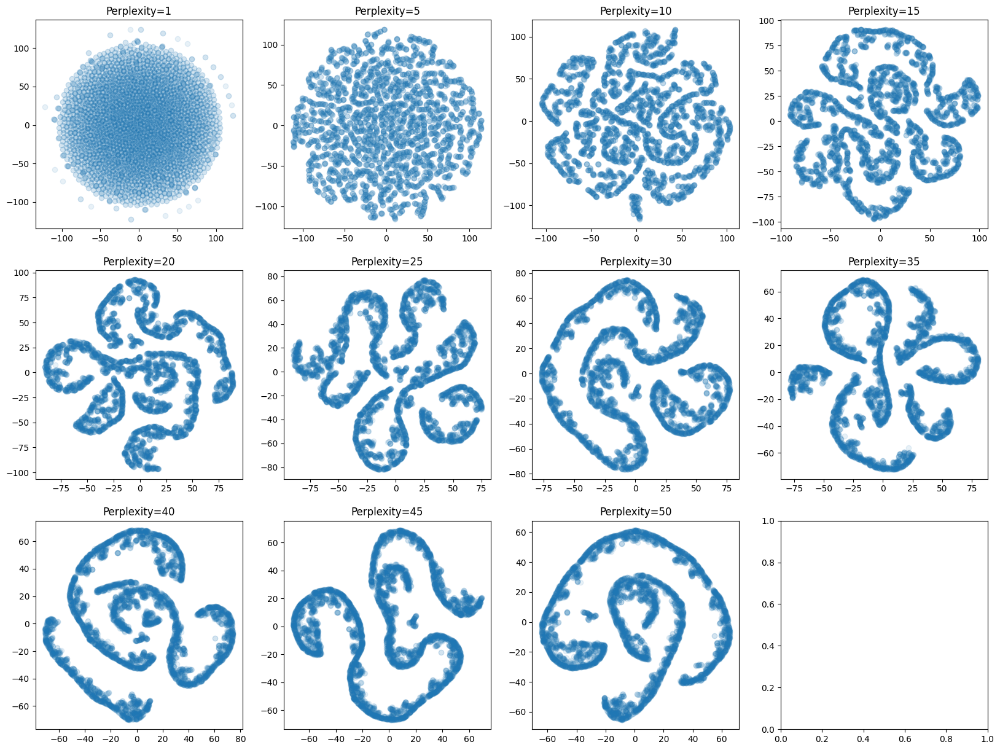

In [9]:
from sklearn.manifold import TSNE

_, axs = plt.subplots(3, 4, figsize=(20, 15))
axs = axs.flatten()

for ax, perplexity in zip(axs, tqdm(range(0, 50+1, 5))):
    tsne = TSNE(n_components=2, init="random", n_jobs=128, perplexity=max(1, perplexity))

    tsne_projection = tsne.fit_transform(df_features.values)
    
    ax.scatter(tsne_projection[:, 0], tsne_projection[:, 1], alpha=.1)
    ax.set_title(f'Perplexity={max(1, perplexity)}')

plt.show()

  0%|          | 0/11 [00:00<?, ?it/s]

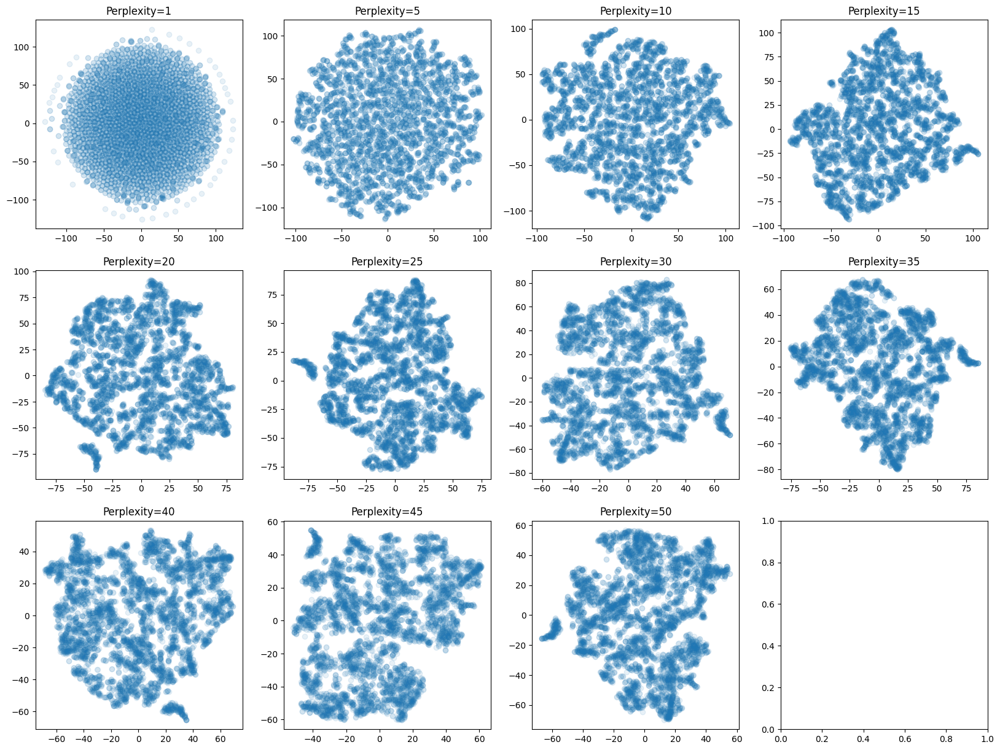

In [10]:
_, axs = plt.subplots(3, 4, figsize=(20, 15))
axs = axs.flatten()

for ax, perplexity in zip(axs, tqdm(range(0, 50+1, 5))):
    tsne = TSNE(n_components=2, init="random", n_jobs=128, perplexity=max(1, perplexity))

    tsne_projection = tsne.fit_transform(df_features_scaled.values)
    
    ax.scatter(tsne_projection[:, 0], tsne_projection[:, 1], alpha=.1)
    ax.set_title(f'Perplexity={max(1, perplexity)}')

plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

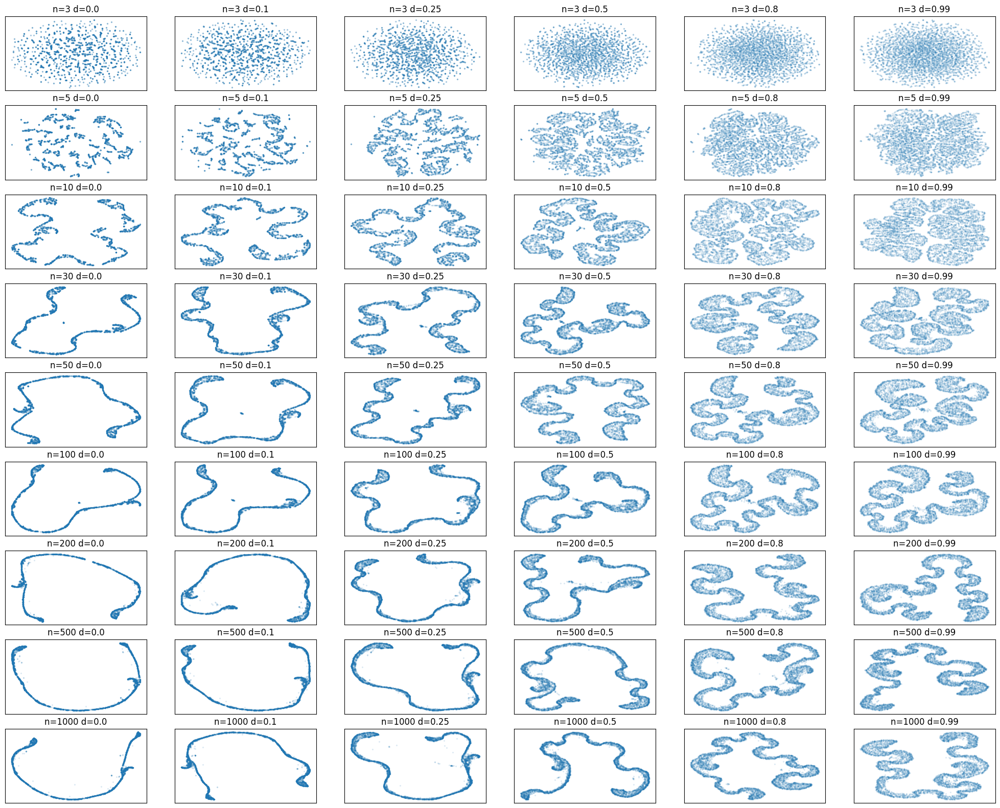

In [11]:
#pip install umap-learn
import umap
import warnings
warnings.filterwarnings("ignore")

n_neighbors_list = [3, 5, 10, 30, 50, 100, 200, 500, 1000]
min_dist_list = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

_, axs = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(25, 20))

for i, n_neighbors in enumerate(tqdm(n_neighbors_list)):
    for j, min_dist in enumerate(min_dist_list):
        reducer = umap.UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=min_dist)
        embedding = reducer.fit_transform(df_features.values)
        axs[i, j].scatter(embedding[:, 0], embedding[:, 1], alpha=.1, s=2)
        axs[i, j].set_title(f'n={n_neighbors} d={min_dist}')
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

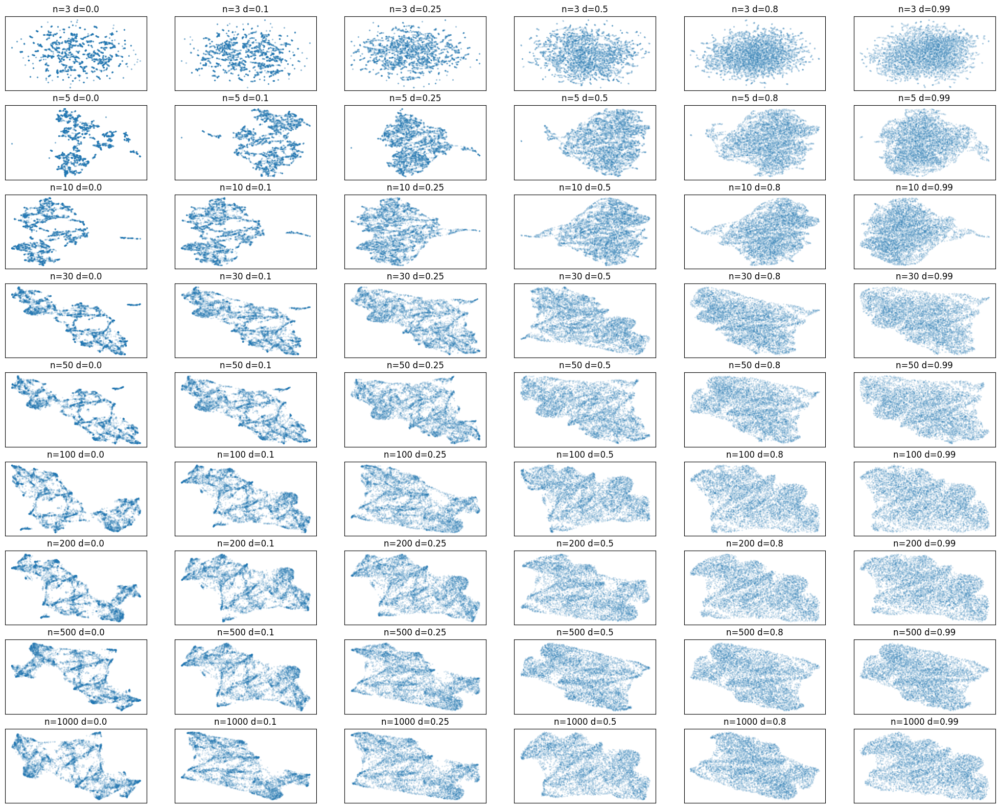

In [12]:
#pip install umap-learn
import umap
import warnings
warnings.filterwarnings("ignore")

n_neighbors_list = [3, 5, 10, 30, 50, 100, 200, 500, 1000]
min_dist_list = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

_, axs = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(25, 20))

for i, n_neighbors in enumerate(tqdm(n_neighbors_list)):
    for j, min_dist in enumerate(min_dist_list):
        reducer = umap.UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=min_dist)
        embedding = reducer.fit_transform(df_features_scaled.values)
        axs[i, j].scatter(embedding[:, 0], embedding[:, 1], alpha=.1, s=2)
        axs[i, j].set_title(f'n={n_neighbors} d={min_dist}')
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

plt.show()

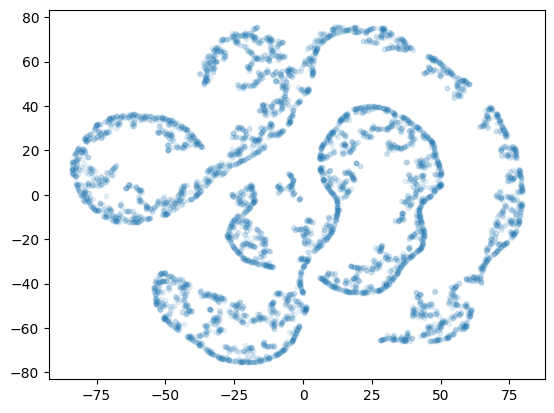

In [13]:
reducer = TSNE(perplexity=25, n_jobs=20, init='random')
embedding = reducer.fit_transform(df_features.values)

plt.scatter(embedding[:, 0], embedding[:, 1], alpha=.1, s=10)

In [50]:
from sklearn.cluster import KMeans, OPTICS, MeanShift, SpectralClustering

clu = OPTICS(n_jobs=32, min_samples=.005)
cluster_labels = clu.fit_predict(embedding)
print(len(np.unique(cluster_labels)))

53


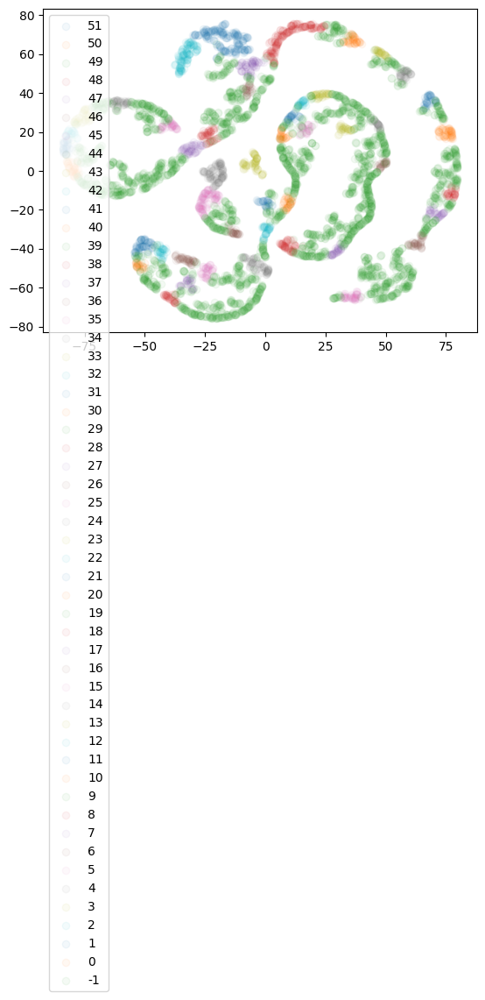

In [51]:
for label in sorted(np.unique(cluster_labels))[::-1]:
    matrix_cluster = embedding[label==cluster_labels]
    plt.scatter(matrix_cluster[:, 0], 
                matrix_cluster[:, 1], 
                alpha=.05,
                label=label)

plt.legend()

In [52]:
geolets = geolet.candidate_geolets
geolets_keys = np.array(list(geolets.keys()))
dist_matrix = geolet.selector.dist_matrix

In [53]:
medoids = dict()

intra_cluster_distance = np.zeros((len(geolets),))
for idx, label in enumerate(cluster_labels):
    intra_cluster_distance[idx] = np.sum(embedding[cluster_labels == label])

for label in tqdm(np.unique(cluster_labels), desc="Collecting medoids"):
    min_idx = np.argmin(intra_cluster_distance[cluster_labels == label])
    key = geolets_keys[cluster_labels == label][min_idx]
    medoids[f"cl={label}_{key}"] = geolets[key]
    scores = intra_cluster_distance[cluster_labels == label][min_idx]

  0%|          | 0/53 [00:00<?, ?it/s]

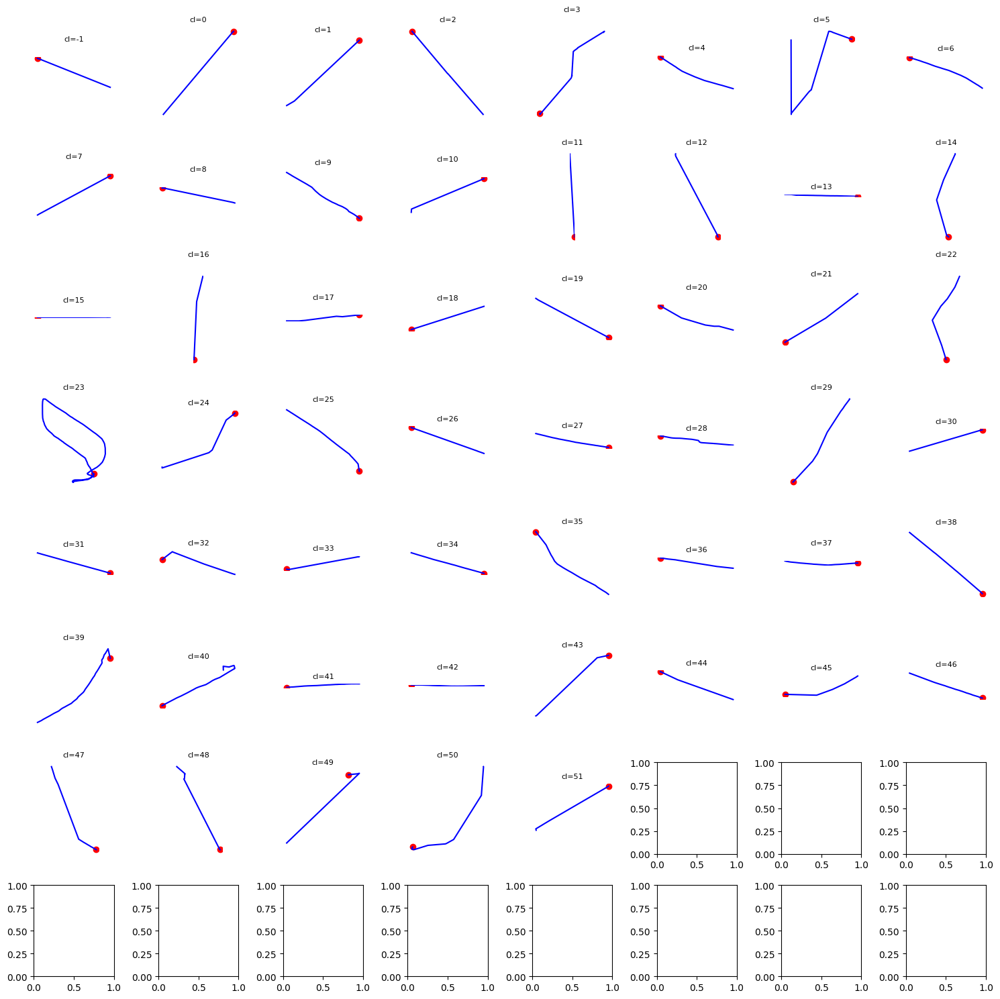

In [54]:
import math

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, (geolet_id, geolet_data) in zip(axes, tqdm(medoids.items())):
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id.split("_")[0], fontsize=8)
    ax.set_aspect('equal')
    ax.axis('off')  

plt.tight_layout()
plt.show()

In [55]:
df_features.columns

Index(['avg_speed', 'std_accel', 'distance_sum', 'distance_std',
       'start2end_distance', 'straightness', 'meanSquaredDisplacement',
       'sinuosity', 'intensityUse', 'intersections'],
      dtype='object')

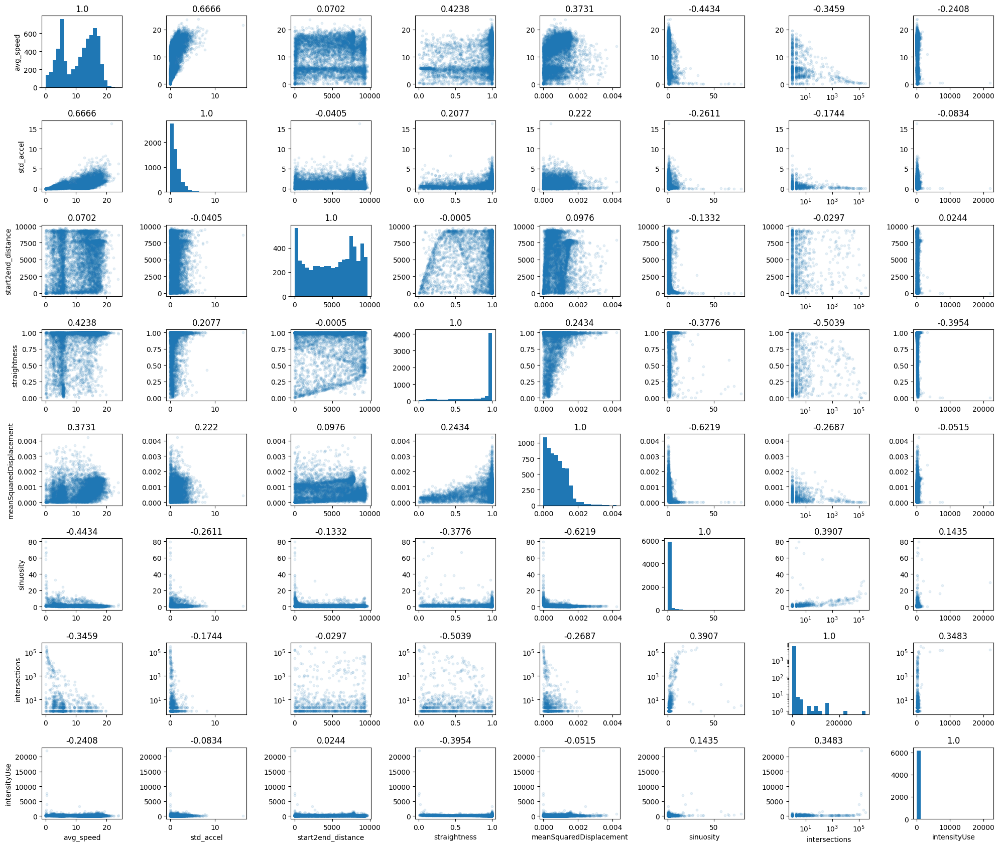

In [56]:
cols = ['avg_speed', 'std_accel', 'start2end_distance', 'straightness', 'meanSquaredDisplacement', 'sinuosity', 'intersections', 
        'intensityUse']

import math

fig, axes = plt.subplots(len(cols), len(cols), figsize=(20, 17))

for i, row in enumerate(cols):
    for j, col in enumerate(cols):
        
        if i == j:
            axes[j, i].hist(df_features[row], bins=20)
        else:
            axes[j, i].scatter(df_features[row], df_features[col], alpha=.1, s=10)
        
        if j == len(cols)-1:
            axes[j, i].set_xlabel(row)
        if i == 0:
            axes[j, i].set_ylabel(col)
        if row == 'intersections' and i != j:
            axes[j, i].set_xscale('log')
        if col == 'intersections':
            axes[j, i].set_yscale('log')
        
        axes[i, j].set_title(f'{round(df_features[row].corr(df_features[col], method="spearman"), 4)}')

plt.tight_layout()
plt.show()

In [57]:
df_features.intensityUse.quantile(.9)

380.57838542933223

# 1

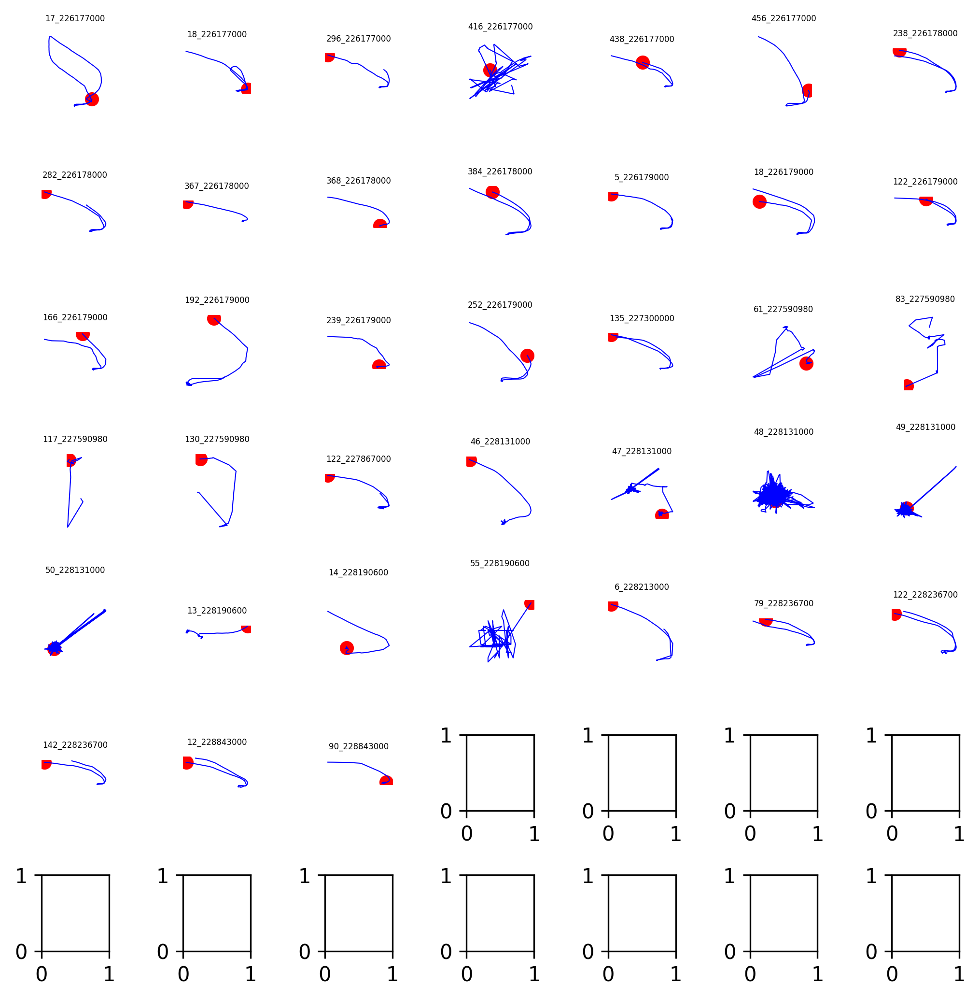

In [58]:
medoids = geolets_keys[
    (df_features.intersections.values > 100) & 
    (df_features.intensityUse.values > df_features.intensityUse.quantile(.8))
]

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(7, 7), dpi=300)
axes = axes.flatten()

for ax, geolet_id in zip(axes, medoids):
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue', linewidth=.5)
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=4)
    ax.set_aspect('equal') 
    ax.axis('off') 

plt.tight_layout()
plt.show()

In [59]:
medoids = ['50_228131000', '142_228236700', '17_226177000']

from matplotlib import colors

def plot_folium(geolet_sub):
    m = folium.Map(location=[geolet_sub.latitude[0], geolet_sub.longitude[0]], zoom_start=17)

    segment = list(zip(geolet_sub.latitude, geolet_sub.longitude))
    
    folium.PolyLine(segment, weight=2, opacity=0.7).add_to(m)
        
    display(m)

for medoid in medoids:
    print(medoid)
    plot_folium(geolets[medoid])

50_228131000


142_228236700


17_226177000


# 2

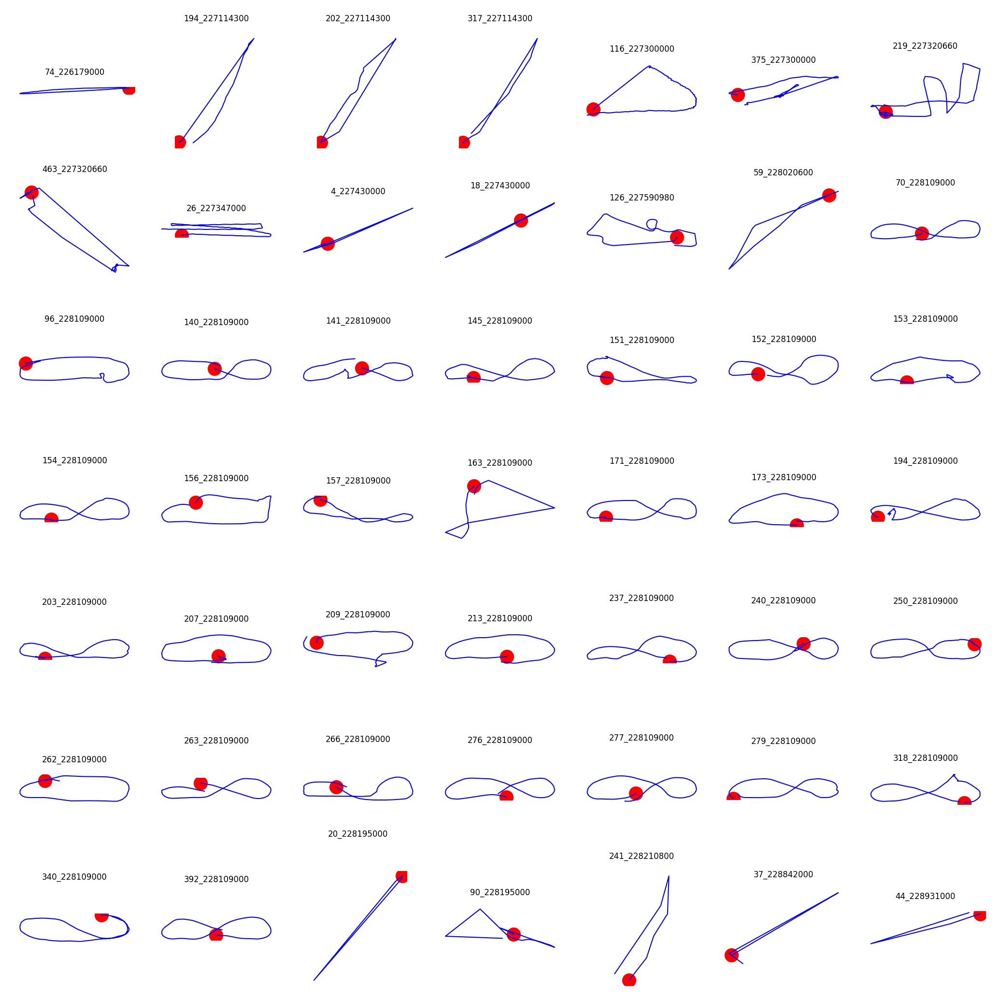

In [60]:
medoids = geolets_keys[
    (df_features.intersections.values < 20) & 
    (df_features.straightness.values < df_features.straightness.quantile(.01))
]

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(7, 7), dpi=300)
axes = axes.flatten()

for ax, geolet_id in zip(axes, medoids):
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue', linewidth=.5)
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=4)
    ax.set_aspect('equal') 
    ax.axis('off') 

plt.tight_layout()
plt.show()

In [61]:
medoids = geolets_keys[
    (df_features.intersections.values < 10) & 
    (df_features.sinuosity.values > df_features.sinuosity.quantile(.99))
]

print(len(medoids))

48


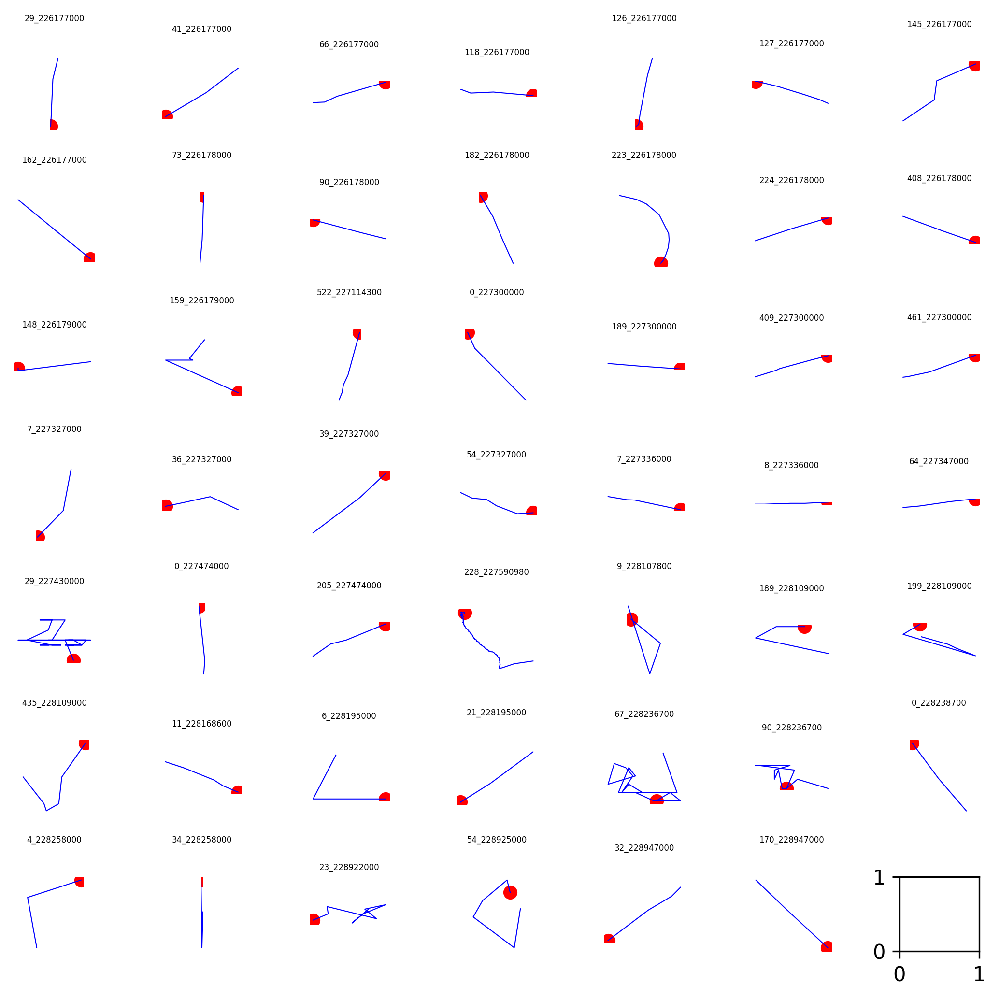

In [62]:
fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(7, 7), dpi=300)
axes = axes.flatten()

for ax, geolet_id in zip(axes, medoids):
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue', linewidth=.5)
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=4)
    ax.set_aspect('equal') 
    ax.axis('off') 

plt.tight_layout()
plt.show()

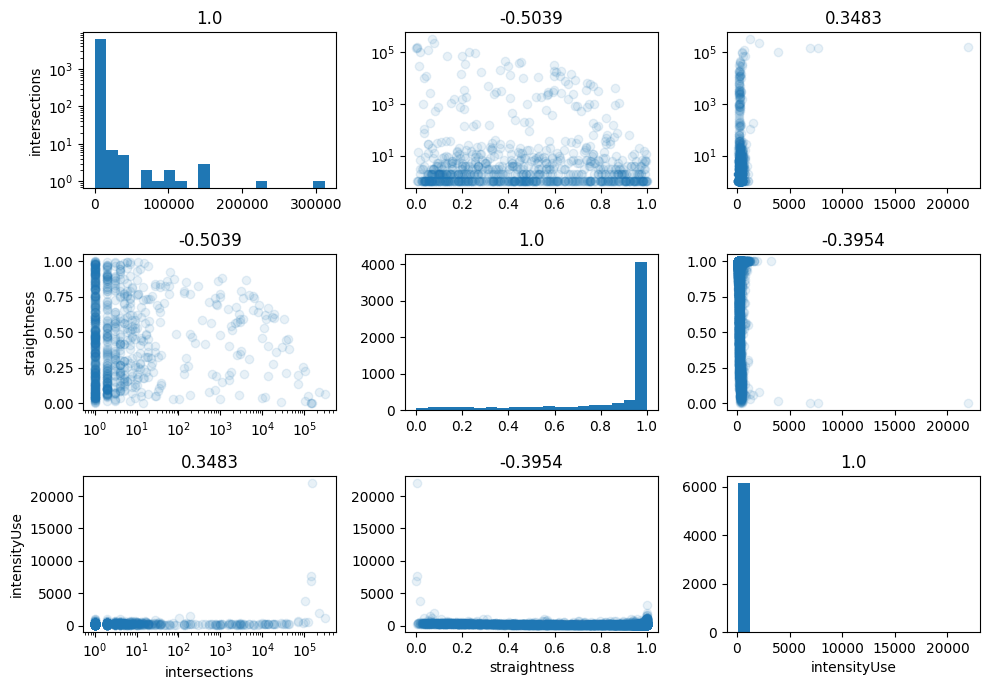

In [63]:
cols = ['intersections', 'straightness', 'intensityUse']

fig, axes = plt.subplots(len(cols), len(cols), figsize=(10, 7))

for i, row in enumerate(cols):
    for j, col in enumerate(cols):
        
        if i == j:
            axes[j, i].hist(df_features[row], bins=20)
        else:
            axes[j, i].scatter(df_features[row], df_features[col], alpha=.1)
        
        if j == len(cols)-1:
            axes[j, i].set_xlabel(row)
        if i == 0:
            axes[j, i].set_ylabel(col)
        if row == 'intersections' and i != j:
            axes[j, i].set_xscale('log')
        if col == 'intersections':
            axes[j, i].set_yscale('log')
        
        axes[i, j].set_title(f'{round(df_features[row].corr(df_features[col], method="spearman"), 4)}')

plt.tight_layout()
plt.show()

# Test 1: first filter with features, then use shapes

In [64]:
sub_row_index = np.where(df_features.straightness < .2)[0]

In [65]:
len(sub_row_index)

313

## OPTICS

In [66]:
#Optimize runtime by computing the new distance matrix only one time
from scipy.spatial.distance import cdist

dist_matrix_optics = cdist(dist_matrix[np.ix_(sub_row_index, sub_row_index)], 
                           dist_matrix[np.ix_(sub_row_index, sub_row_index)], metric='minkowski', p=2)

In [67]:
from sklearn.cluster import OPTICS

op = OPTICS(n_jobs=20, metric='precomputed')
op_result = op.fit_predict(dist_matrix_optics)

In [68]:
len(np.unique(op_result))

11

In [69]:
optics_results = []

for min_samples in tqdm([.3, .2, .1, .05, .01, .005, .002, .001, .0005, .0002, .0001]):
    op = OPTICS(n_jobs=20, metric='precomputed', min_samples=min_samples)
    op_result = op.fit_predict(dist_matrix_optics)
    optics_results.append((len(np.unique(op_result)), op_result))
    print(len(np.unique(op_result)))

  0%|          | 0/11 [00:00<?, ?it/s]

2
2
2
2
31
64
64
64
64
64
64


In [70]:
op_result = optics_results[4][1]
print(len(np.unique(op_result)))

31


In [71]:
medoids = dict()

intra_cluster_distance = np.zeros((len(sub_row_index),))
for idx, label in enumerate(op_result):
    intra_cluster_distance[idx] = np.sum(dist_matrix_optics[idx][op_result == label])

for label in tqdm(np.unique(op_result), desc="Collecting medoids"):
    min_idx = np.argmin(intra_cluster_distance[op_result == label])
    key = geolets_keys[sub_row_index][op_result == label][min_idx]
    medoids[f"cl={label}_{key}"] = geolets[key]
    scores = intra_cluster_distance[op_result == label][min_idx]

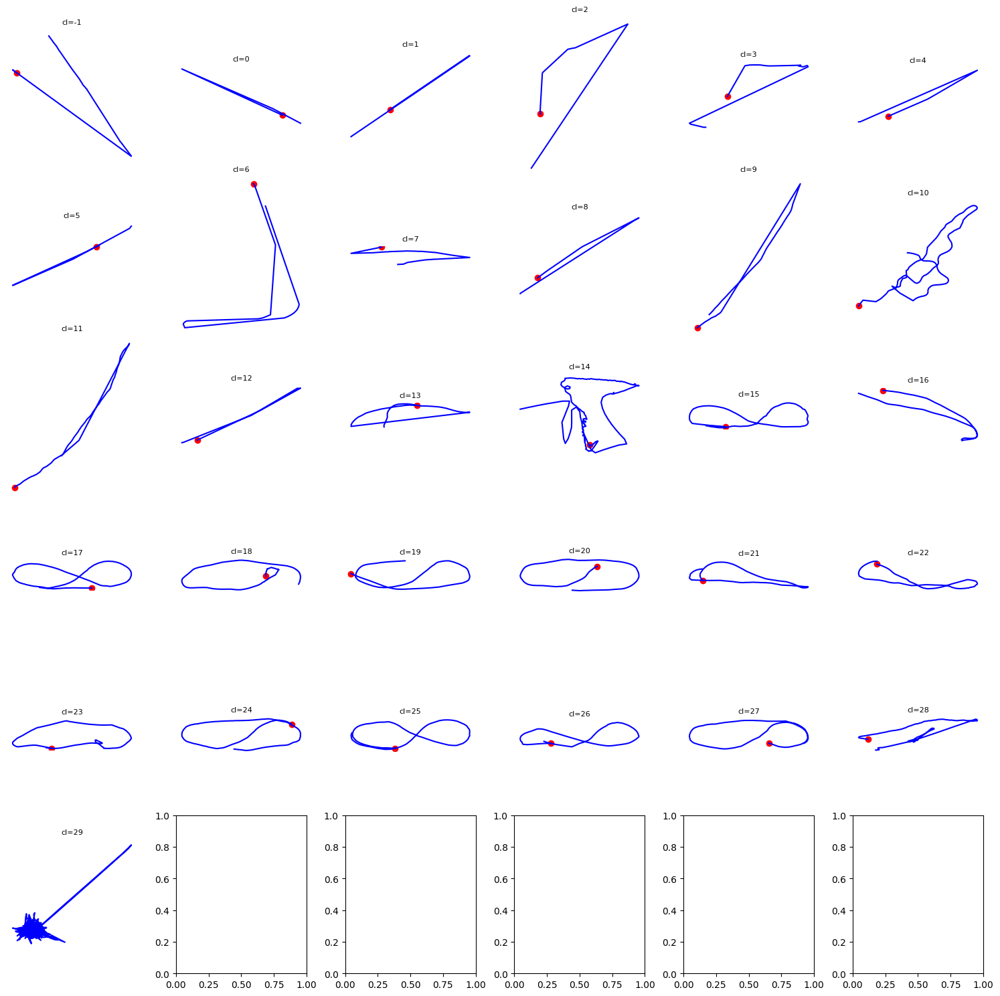

In [72]:
fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, (geolet_id, geolet_data) in zip(axes, medoids.items()):
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id.split("_")[0], fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

## Self-organizing maps

In [73]:
from minisom import MiniSom

In [74]:
som_shape = (200, 1)
som = MiniSom(som_shape[0], som_shape[1], 
              dist_matrix[np.ix_(sub_row_index, sub_row_index)].shape[1], 
              sigma=.5, learning_rate=.5,
              neighborhood_function='gaussian', random_seed=42)

som.train_batch(dist_matrix[np.ix_(sub_row_index, sub_row_index)], 10000, verbose=True)

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.1427129861428744


In [75]:
# each neuron represents a cluster
winner_coordinates = np.array([som.winner(x) for x in tqdm(dist_matrix[np.ix_(sub_row_index, sub_row_index)])]).T
# with np.ravel_multi_index we convert the bidimensional
# coordinates to a monodimensional index
cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)

  0%|          | 0/313 [00:00<?, ?it/s]

In [76]:
centroids_position = []

def find_nearest(centroid, dist_matrix):
    delta_dist_matrix = np.abs(dist_matrix - centroid.flatten())
    return np.argmin(delta_dist_matrix.sum(axis=1))

for centroid in tqdm(som.get_weights()):
    centroids_position += [find_nearest(centroid, dist_matrix[np.ix_(sub_row_index, sub_row_index)])]

centroids_position = list(set(centroids_position))
sorted(centroids_position)

  0%|          | 0/200 [00:00<?, ?it/s]

[5,
 12,
 13,
 15,
 18,
 45,
 83,
 87,
 91,
 103,
 110,
 115,
 134,
 137,
 154,
 160,
 164,
 170,
 183,
 197,
 199,
 203,
 213,
 217,
 221,
 226,
 236,
 239,
 241,
 244,
 250,
 255,
 262,
 269,
 273,
 274,
 279,
 287,
 288,
 289,
 293,
 294,
 295,
 296,
 298,
 300,
 309]

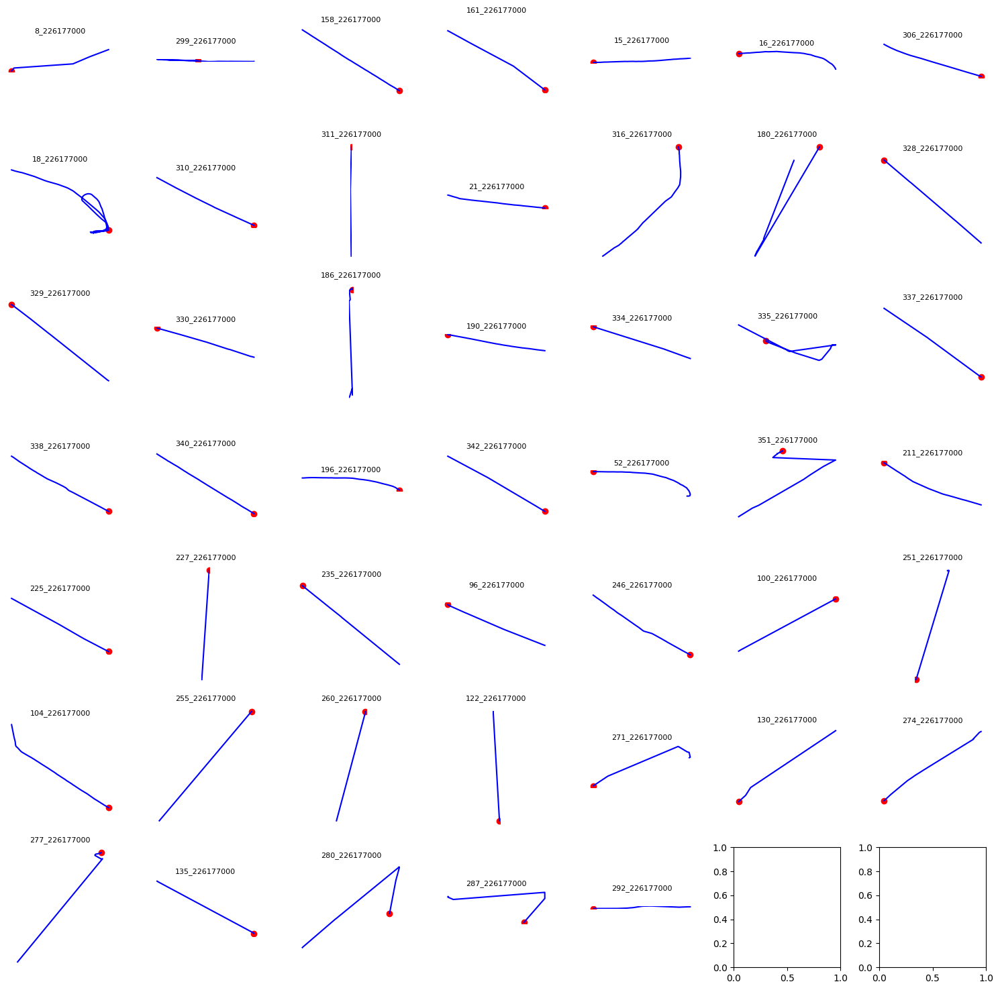

In [77]:
import math

fig, axes = plt.subplots(math.ceil(len(centroids_position)**.5), math.ceil(len(centroids_position)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, geolet_id in zip(axes, geolets_keys[centroids_position]):
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

# Test 2: first use shape, then features

In [78]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=100).fit(dist_matrix)

In [79]:
cluster_labels = km.labels_

medoids = dict()

intra_cluster_distance = np.zeros((len(geolets),))
for idx, label in enumerate(cluster_labels):
    intra_cluster_distance[idx] = np.sum(dist_matrix[idx][cluster_labels == label])

for label in tqdm(np.unique(cluster_labels), desc="Collecting medoids"):
    min_idx = np.argmin(intra_cluster_distance[cluster_labels == label])
    key = geolets_keys[cluster_labels == label][min_idx]
    medoids[f"cl={label}_{key}"] = geolets[key]
    scores = intra_cluster_distance[cluster_labels == label][min_idx]

len(medoids)

100

In [80]:
df_features['geolet_id'] = geolets_keys

In [81]:
df_features[df_features.geolet_id.isin([x[6:] for x in medoids.keys()])]

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections,geolet_id
14,0.958221,0.211561,9.967685,0.008933,26.279065,0.010598,0.000012,9.946647,445.145592,28267,17_226177000
21,15.786202,1.488353,4.638013,0.224864,9146.654628,0.998973,0.000164,0.900851,142.436161,0,24_226177000
46,2.210203,0.397843,9.934188,0.043828,2103.794008,0.753093,0.000128,3.871423,190.164588,6070,53_226177000
69,11.379640,1.234696,9.936177,0.093530,7786.231036,0.999056,0.002105,0.178415,334.322891,0,81_226177000
90,11.627278,1.950786,9.940882,0.024677,1496.626801,0.987650,0.000963,2.071034,130.302597,0,103_226177000
...,...,...,...,...,...,...,...,...,...,...,...
6113,4.908330,0.710460,9.818901,0.747787,3764.550220,0.235851,0.000147,1.080880,381.048366,1,171_228947000
6122,5.603272,1.076853,7.155178,0.412342,2384.209655,0.364125,0.000096,0.962953,253.020274,2,183_228947000
6125,5.309912,0.877573,2.597620,0.125962,6325.891782,0.809371,0.000031,1.566099,174.526676,0,186_228947000
6131,13.280685,2.372501,1.900906,0.549854,6286.905949,0.998925,0.000064,1.176482,499.729945,0,5_228954000


In [82]:
df_features_sub = df_features[df_features.geolet_id.isin([x[6:] for x in medoids.keys()])]

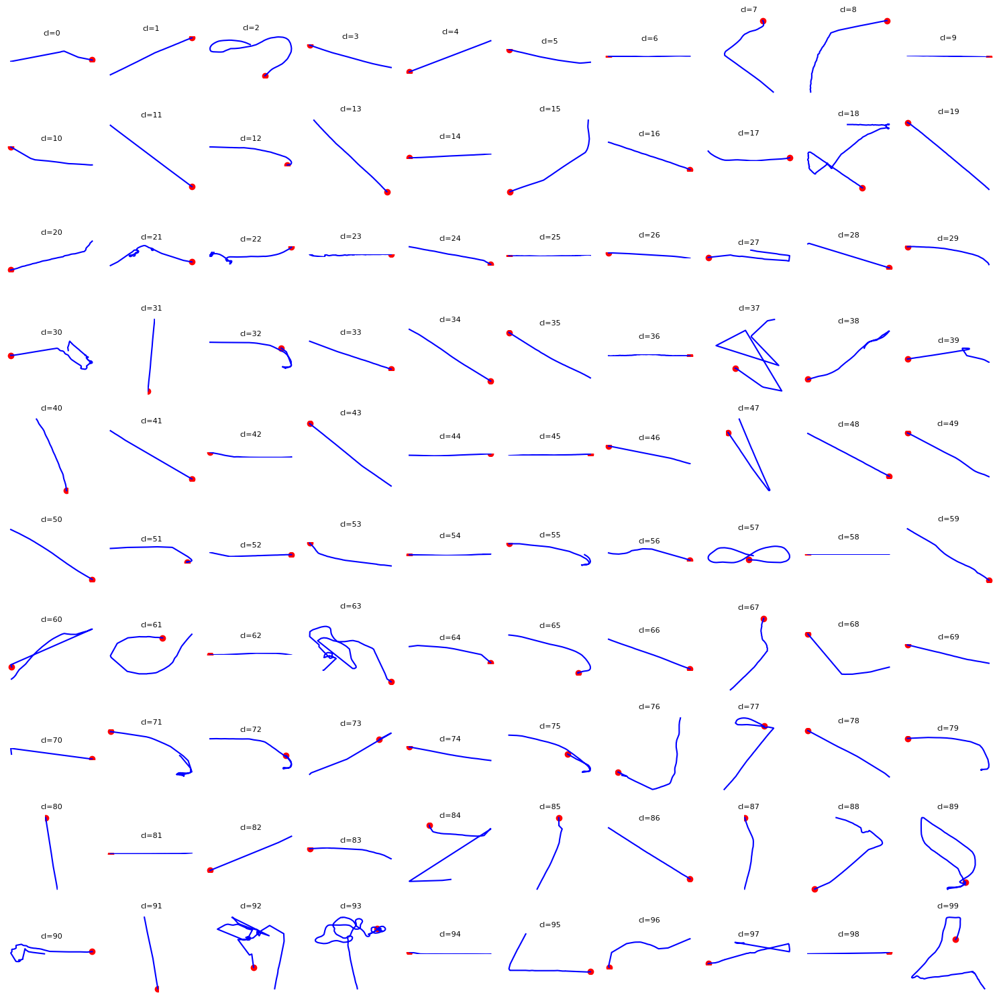

In [85]:
import math

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, (geolet_id, geolet_data) in zip(axes, medoids.items()):
    #print(geolet_id)
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id.split("_")[0], fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

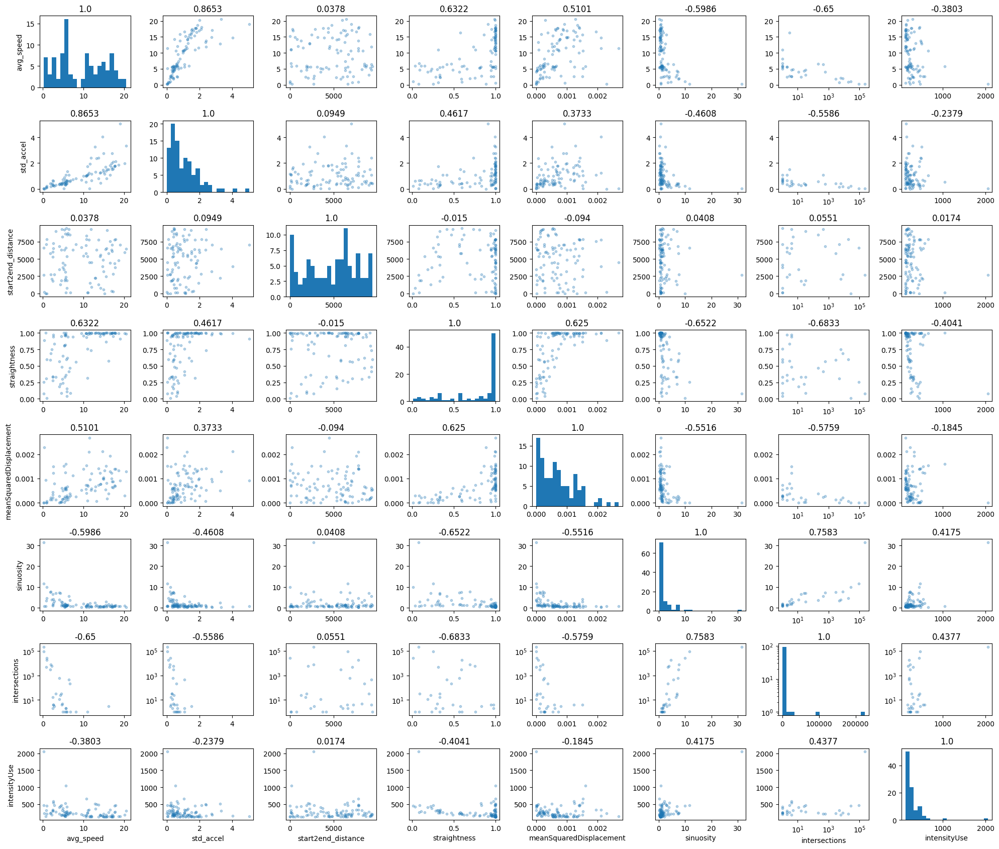

In [83]:
cols = ['avg_speed', 'std_accel', 'start2end_distance', 'straightness', 'meanSquaredDisplacement', 'sinuosity', 'intersections', 
        'intensityUse']

import math

fig, axes = plt.subplots(len(cols), len(cols), figsize=(20, 17))

for i, row in enumerate(cols):
    for j, col in enumerate(cols):
        
        if i == j:
            axes[j, i].hist(df_features_sub[row], bins=20)
        else:
            axes[j, i].scatter(df_features_sub[row], df_features_sub[col], alpha=.3, s=10)
        
        if j == len(cols)-1:
            axes[j, i].set_xlabel(row)
        if i == 0:
            axes[j, i].set_ylabel(col)
        if row == 'intersections' and i != j:
            axes[j, i].set_xscale('log')
        if col == 'intersections':
            axes[j, i].set_yscale('log')
        
        axes[i, j].set_title(f'{round(df_features_sub[row].corr(df_features_sub[col], method="spearman"), 4)}')

plt.tight_layout()
plt.show()